In [2]:
import pandas as pd
import itertools
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.max_rows', None)

In [3]:
df=pd.read_csv('/kaggle/input/patient-drugs-classification/drugsComTrain.tsv', sep='\t')

In [4]:
df.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37


In [5]:
df.condition.value_counts()

condition
Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                               

In [6]:
df_train=df[(df['condition']=='Birth Control') | (df['condition']=='Depression') | (df['condition']=='Pain') | (df['condition']=='Anxiety') | (df['condition']=='Acne') | (df['condition']=='Bipolar Disorder') | (df['condition']=='Insomnia') | (df['condition']=='Weight Loss') | (df['condition']=='Obesity') | (df['condition']=='Diabetes, Type 2') | (df['condition']=='High Blood Pressure') | (df['condition']=='Migraine') ]

In [7]:
df.shape

(161297, 7)

In [8]:
df_train.shape

(72913, 7)

In [9]:
X = df_train.drop(['Unnamed: 0', 'drugName', 'rating','date','usefulCount'], axis=1)

In [10]:
X.condition.value_counts()

condition
Birth Control          28788
Depression              9069
Pain                    6145
Anxiety                 5904
Acne                    5588
Insomnia                3673
Weight Loss             3609
Obesity                 3568
Diabetes, Type 2        2554
High Blood Pressure     2321
Migraine                1694
Name: count, dtype: int64

In [11]:
X.head()

,condition,review
2,Birth Control,"""I used to take another oral contraceptive, wh..."
3,Birth Control,"""This is my first time using any form of birth..."
9,Birth Control,"""I had been on the pill for many years. When m..."
11,Depression,"""I have taken anti-depressants for years, with..."
14,Birth Control,"""Started Nexplanon 2 months ago because I have..."


In [12]:
X_birth = X[(X['condition']=='Birth Control')]
X_dep = X[(X['condition']=='Depression')]
X_bp = X[(X['condition']=='High Blood Pressure')]
X_diat = X[(X['condition']=='Diabetes, Type 2')]
X_mig = X[(X['condition']=='Migraine')]
X_acne = X[(X['condition']=='Acne')]
X_insomnia = X[(X['condition']=='Insomnia')]
X_pain = X[(X['condition']=='Pain')]
X_obesity = X[(X['condition']=='Obesity')]
X_anx = X[(X['condition']=='Anxiety')]
X_wl = X[(X['condition']=='Weight Loss')]

Text(0.5, 1.0, 'Word cloud for Birth control')

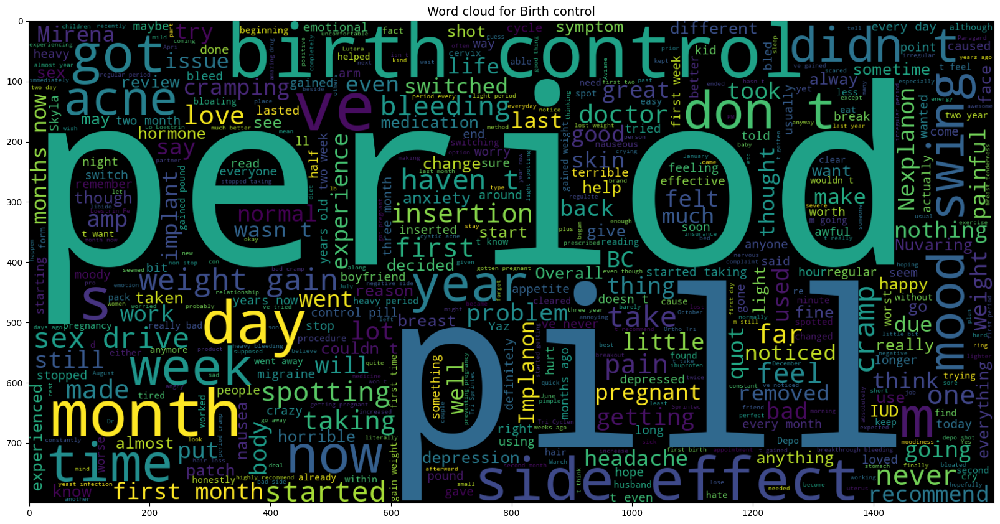

In [13]:
from wordcloud import WordCloud
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_birth.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Birth control', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

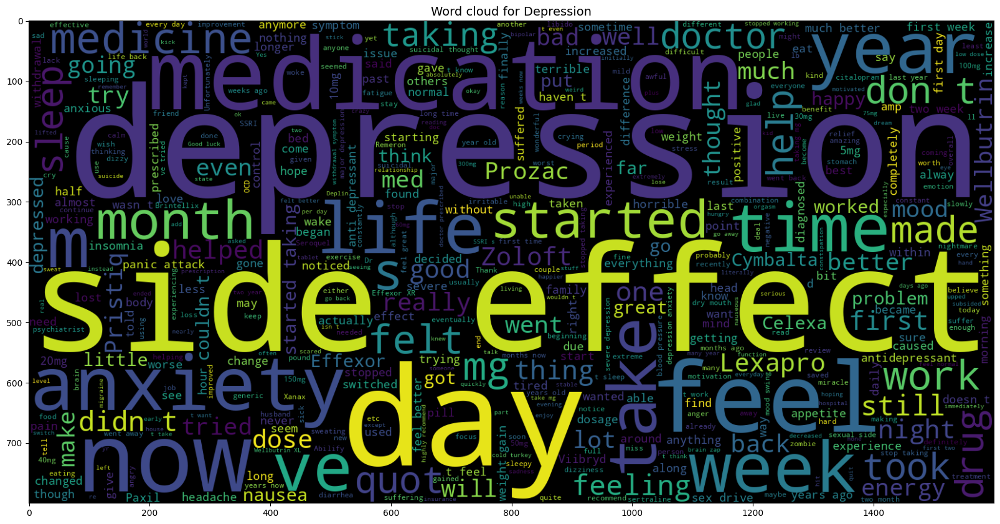

In [14]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_dep.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Depression', fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

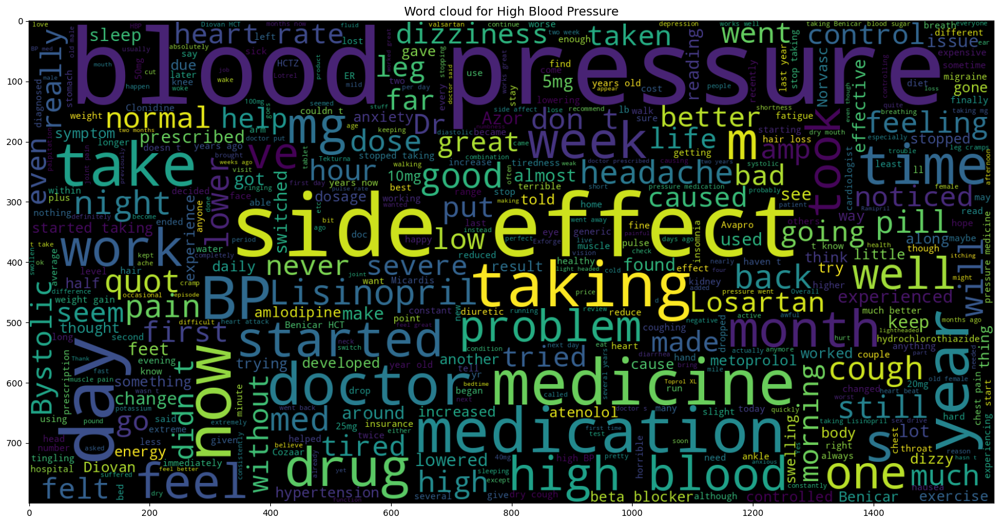

In [15]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_bp.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for High Blood Pressure', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes, Type 2')

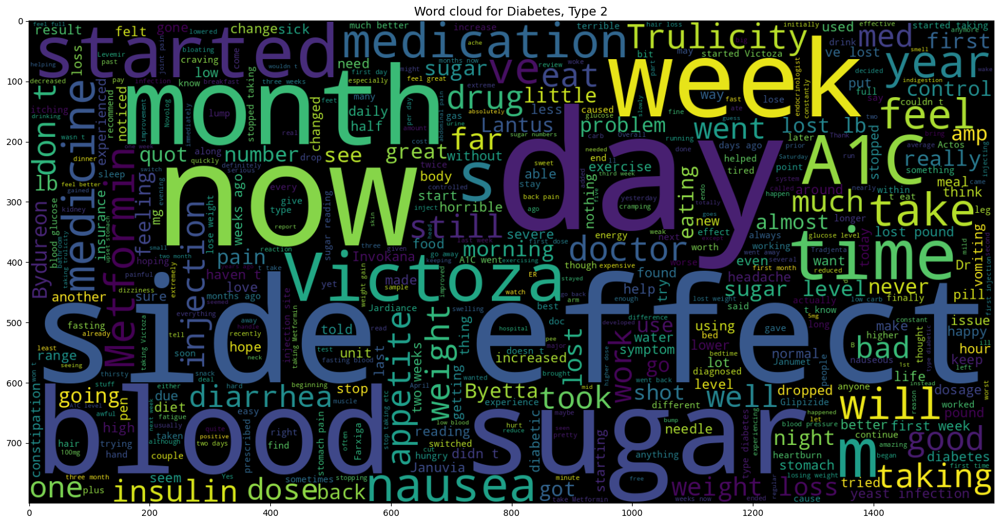

In [16]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_diat.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Diabetes, Type 2', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Migraine')

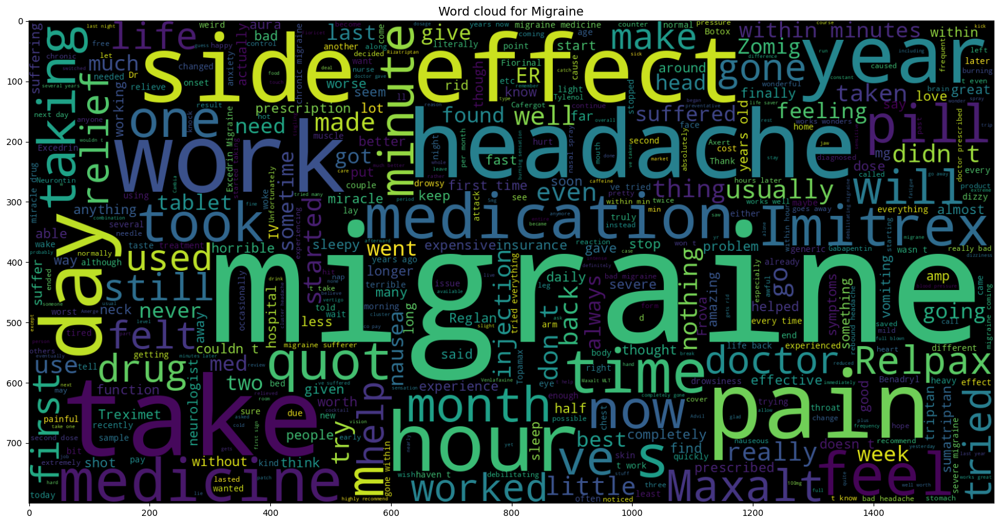

In [17]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_mig.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Migraine', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Acne')

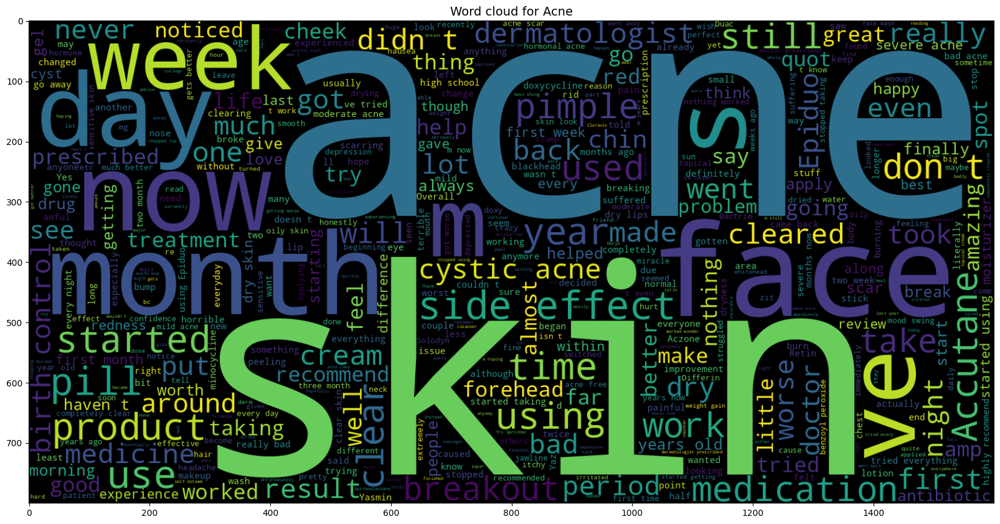

In [18]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_acne.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Acne', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Insomnia')

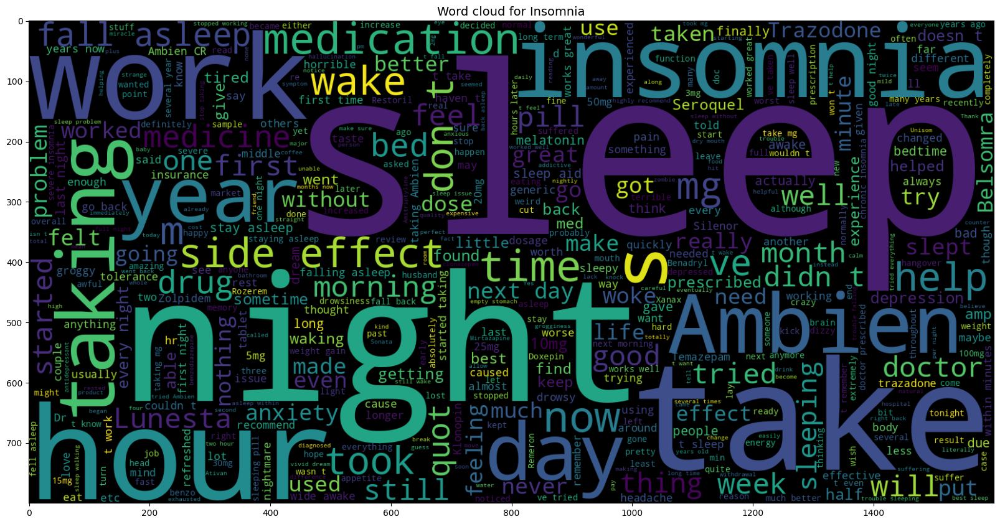

In [19]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_insomnia.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Insomnia', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Pain')

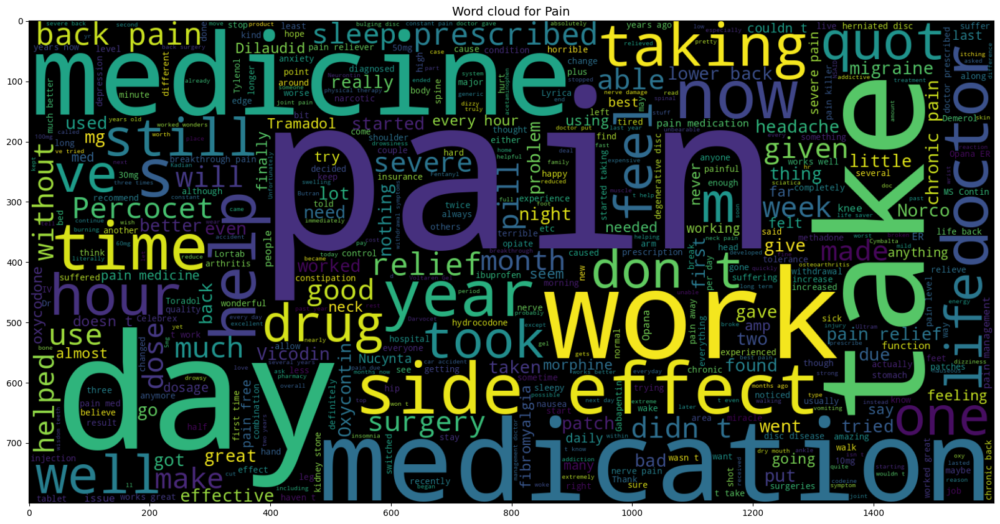

In [20]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_pain.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Pain', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Obesity')

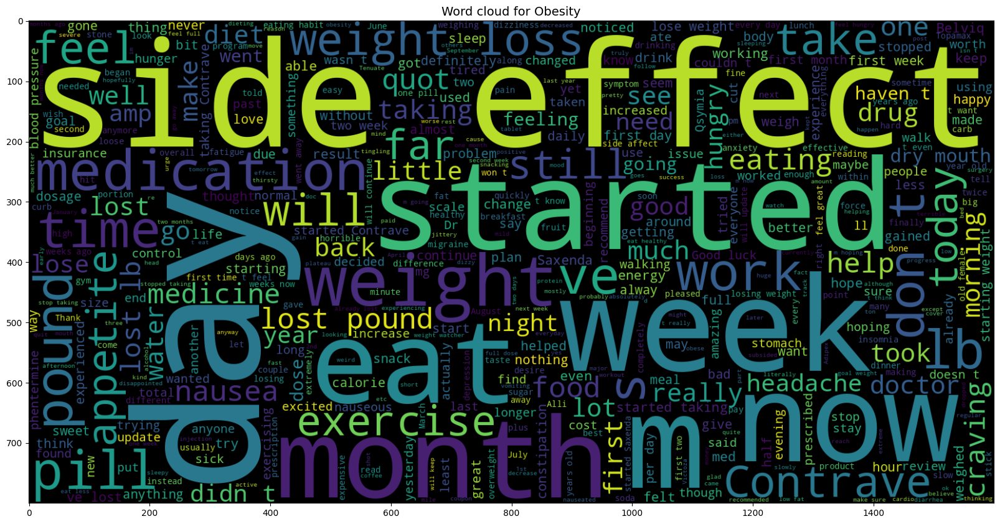

In [21]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_obesity.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Obesity', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Anxiety')

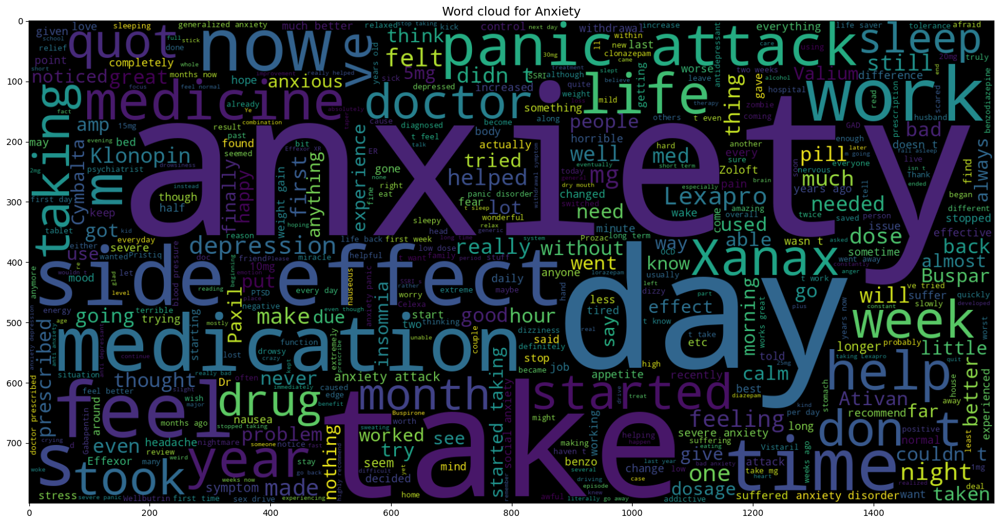

In [22]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_anx.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Anxiety', fontsize=14)

Text(0.5, 1.0, 'Word cloud for Weight loss')

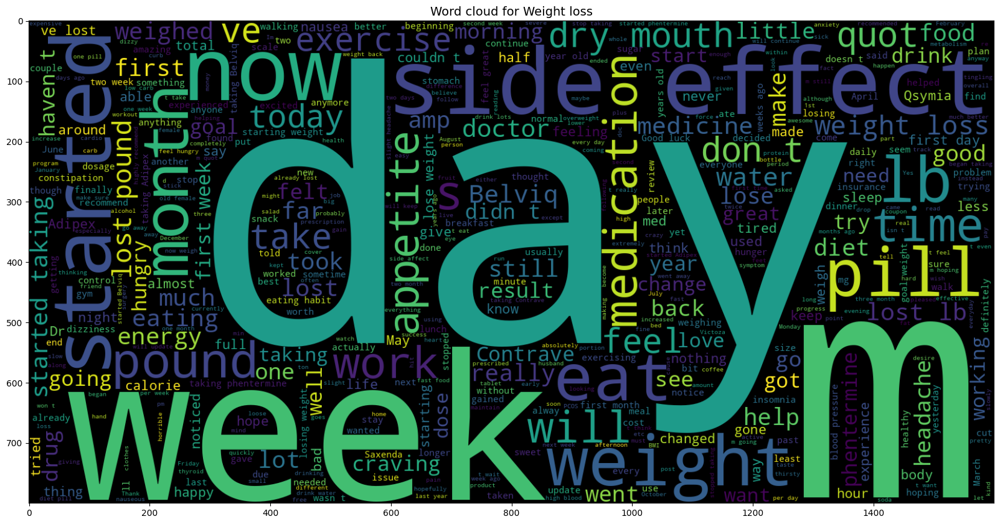

In [23]:
plt.figure(figsize =(20,20))
wc = WordCloud(max_words = 500, width = 1600, height=800).generate(" ".join(X_wl.review))
plt.imshow(wc, interpolation ='bilinear')
plt.title('Word cloud for Weight loss', fontsize=14)

In [24]:
X['review'][2]

'"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."'

In [25]:
for i, col in enumerate(X.columns):
    X.iloc[:, i]=X.iloc[:, i].str.replace('"', '')

In [28]:
pd.set_option('max_colwidth', None)


In [29]:
X.head()

,condition,review
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger."
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
14,Birth Control,"Started Nexplanon 2 months ago because I have a minimal amount of contraception&#039;s I can take due to my inability to take the hormone that is used in most birth controls. I&#039;m trying to give it time because it is one of my only options right now. But honestly if I had options I&#039;d get it removed.\r\nI&#039;ve never had acne problems in my life, and immediately broke out after getting it implanted. Sex drive is completely gone, and I used to have sex with my boyfriend a few days a week, now its completely forced and not even fun for me anymore. I mean I&#039;m on birth control because I like having sex but don&#039;t want to get pregnant, why take a birth control that takes away sex? Very unhappy and hope that I get it back with time or I&#039;m getting it removed."


In [30]:
from nltk.corpus import stopwords
stop =  stopwords.words('english')

In [31]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [34]:
from nltk.stem import WordNetLemmatizer

lemmatizer= WordNetLemmatizer()

In [35]:
from bs4 import BeautifulSoup
import re

In [40]:
import nltk
nltk.download('wordnet')


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [45]:
def review_to_words(raw_review):
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    words=letters_only.lower().split()
    meaningful_words = [w for w in words if not w in stop]
    lemmitize_words= [lemmatizer.lemmatize(w) for w in meaningful_words]
    return(' '.join(lemmitize_words))

In [54]:
import nltk
print(nltk.data.path)


['/root/nltk_data', '/usr/share/nltk_data', '/usr/local/share/nltk_data', '/usr/lib/nltk_data', '/usr/local/lib/nltk_data']


In [55]:
# Look recursively for any wordnet files or folders
!find /root/nltk_data /usr/share/nltk_data /usr/local/share/nltk_data /usr/lib/nltk_data /usr/local/lib/nltk_data -name "wordnet*"


find: ‘/root/nltk_data’: No such file or directory
/usr/share/nltk_data/corpora/wordnet_ic
/usr/share/nltk_data/corpora/wordnet.zip
/usr/share/nltk_data/corpora/wordnet_ic.zip
find: ‘/usr/local/share/nltk_data’: No such file or directory
find: ‘/usr/lib/nltk_data’: No such file or directory
find: ‘/usr/local/lib/nltk_data’: No such file or directory


In [59]:
!unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/


Archive:  /usr/share/nltk_data/corpora/wordnet.zip
   creating: /usr/share/nltk_data/corpora/wordnet/
  inflating: /usr/share/nltk_data/corpora/wordnet/lexnames  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adv  
  inflating: /usr/share/nltk_data/corpora/wordnet/adv.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/cntlist.rev  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.adj  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adj  
  inflating: /usr/share/nltk_data/corpora/wordnet/LICENSE  
  inflating: /usr/share/nltk_data/corpora/wordnet/citation.bib  
  inflating: /usr/share/nltk_data/corpora/wordnet/noun.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/verb.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/README  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.sense  
  inflating: /usr/share/nltk_data

In [60]:
!ls /usr/share/nltk_data/corpora/wordnet


adj.exc       cntlist.rev  data.noun  index.adv    index.verb  noun.exc
adv.exc       data.adj	   data.verb  index.noun   lexnames    README
citation.bib  data.adv	   index.adj  index.sense  LICENSE     verb.exc


In [61]:
Y=pd.DataFrame({'review': ["This is a test review!", "Lemmatizing is working well."]})
Y['review_clean'] = Y['review'].apply(review_to_words)

In [62]:
X['review_clean'] = X['review'].apply(review_to_words)

In [63]:
X.head()

,condition,review,review_clean
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day side effect contained hormone gestodene available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger.",pill many year doctor changed rx chateal effective really help completely clearing acne take month though gain extra weight develop emotional health issue stopped taking bc started using natural method birth control started take bc hate acne came back age really hope symptom like depression weight gain begin affect older also naturally moody may worsen thing negative mental rut today also hope push edge believe depressed hopefully like younger
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects.",taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition sinking low low major depression taking month feel like normal person first time ever best thing side effect
14,Birth Control,"Started Nexplanon 2 months ago because I have a minim

In [64]:
X_feat=X['review_clean']
y=X['condition']

In [65]:
X_train, X_test,y_train, y_test = train_test_split(X_feat, y, stratify=y, test_size=0.2, random_state=0)

In [67]:
def plot_confusion_matrix(cm, classes,
                         normalize=False,
                         title='Confusion matrix',
                         cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm=cm.astype('float') / cm.sum(axiz=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion Matric, without normalization")

    thresh = cm.max()/2.
    for i,j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i,j],
                 horizontalalignment="center",
                 color="white" if cm[i,j]> thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
        

In [75]:
count_vectorizer = CountVectorizer(stop_words='english')

In [76]:
count_train = count_vectorizer.fit_transform(X_train)

In [77]:
count_test = count_vectorizer.transform(X_test)

In [71]:
count_train

<58330x22876 sparse matrix of type '<class 'numpy.int64'>'
	with 1805703 stored elements in Compressed Sparse Row format>

Machine Learning: Naive Bayes

accuracy: 0.870
Confusion Matric, without normalization


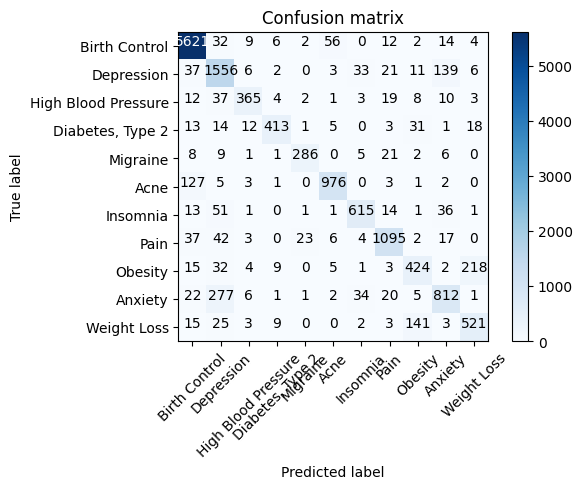

In [78]:
mnb = MultinomialNB()
mnb.fit(count_train, y_train)
pred = mnb.predict(count_test)
score= metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)

cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])

Machine Learning Model: Passive Aggressive Classifier

accuracy: 0.885
Confusion Matric, without normalization


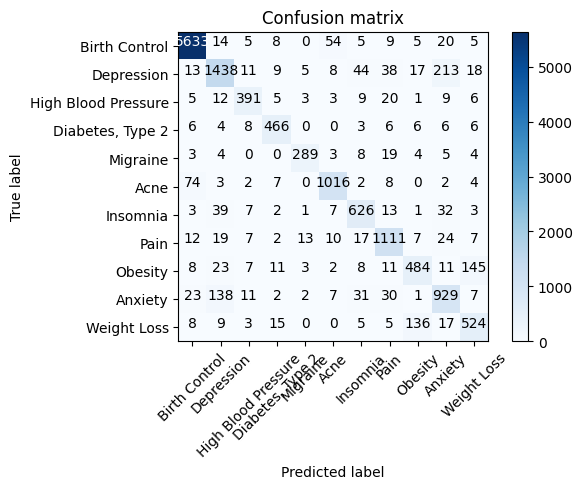

In [79]:
from sklearn.linear_model import PassiveAggressiveClassifier, LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(count_train, y_train)
pred= passive.predict(count_test)
score = metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])

TFIDF

In [81]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [82]:
tfidf_vectorizer = TfidfVectorizer(stop_words= 'english', max_df=0.8)
tfidf_train_2 = tfidf_vectorizer.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer.transform(X_test)

Machine Learning Model: Naive Bayes

accuracy: 0.744
Confusion Matric, without normalization


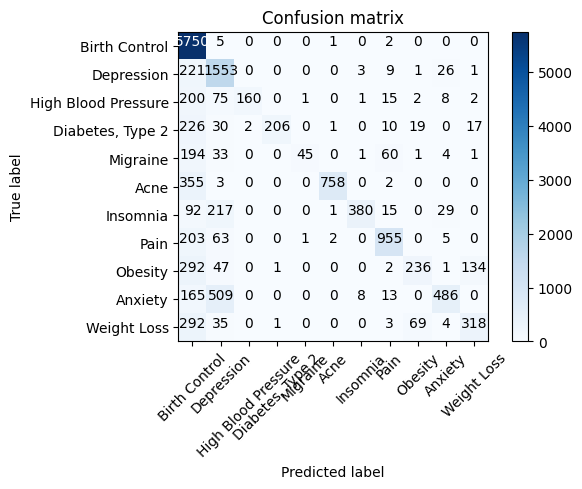

In [83]:
mnb = MultinomialNB()
mnb.fit(tfidf_train_2, y_train)
pred = mnb.predict(tfidf_test_2)
score= metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)

cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])

accuracy: 0.900
Confusion Matric, without normalization


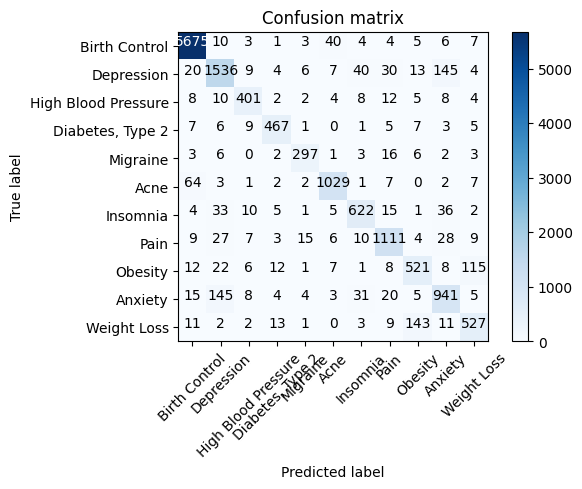

In [84]:
from sklearn.linear_model import PassiveAggressiveClassifier, LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(tfidf_train_2, y_train)
pred= passive.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])

TFIDF: Bigrams

In [85]:
tfidf_vectorizer2 = TfidfVectorizer(stop_words= 'english', max_df=0.8, ngram_range=(1,2))
tfidf_train_2 = tfidf_vectorizer2.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer2.transform(X_test)

accuracy: 0.925
Confusion Matric, without normalization


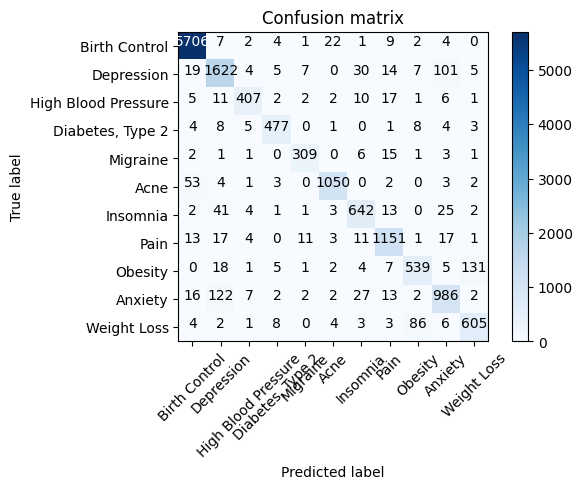

In [87]:
from sklearn.linear_model import PassiveAggressiveClassifier, LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(tfidf_train_2, y_train)
pred= passive.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])

TFIDF: Trigrams

In [88]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words= 'english', max_df=0.8, ngram_range=(1,3))
tfidf_train_3 = tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3 = tfidf_vectorizer3.transform(X_test)

accuracy: 0.928
Confusion Matric, without normalization


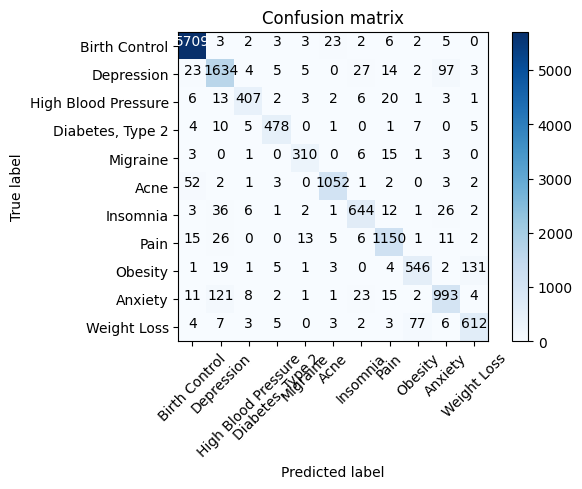

In [89]:
from sklearn.linear_model import PassiveAggressiveClassifier, LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(tfidf_train_3, y_train)
pred= passive.predict(tfidf_test_3)
score = metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'High Blood Pressure', 'Diabetes, Type 2', 'Migraine', 'Acne', 'Insomnia', 'Pain', 'Obesity', 'Anxiety', 'Weight Loss'])

Most Important features

In [94]:
def most_informative_feature_for_class(vectorizer, classifier, classlabel, n=10):
    labelid = list(classifier.classes_).index(classlabel)
    feature_names = vectorizer.get_feature_names_out()
    topn = sorted(zip(classifier.coef_[labelid], feature_names))[-n:]
    for coef, feat in topn:
        print (classlabel, feat, coef)

In [95]:
most_informative_feature_for_class(tfidf_vectorizer, passive, 'Birth Control')

Birth Control prominently 0.9059870379309013
Birth Control ruled 0.9472593563478311
Birth Control rumbling 0.9883093933878456
Birth Control accessing 0.9932349394283075
Birth Control corrolate 1.0363031369406994
Birth Control irrespective 1.0535062046175911
Birth Control additionally 1.1173223886092987
Birth Control sephora 1.271061812519051
Birth Control seriquel 1.320996220218871
Birth Control seperates 1.3283881681901104


In [96]:
most_informative_feature_for_class(tfidf_vectorizer, passive, 'Depression')

Depression boxing 0.679492937091779
Depression anemic 0.72361214731934
Depression balancer 0.7872456532509411
Depression violin 0.8211724250307665
Depression arnp 0.8356511958301837
Depression viorele 0.8434850081949721
Depression stemmed 0.8798481606203599
Depression ended 0.9516806252899722
Depression endep 0.9880665375262448
Depression alese 5.1787951545683


In [97]:
most_informative_feature_for_class(tfidf_vectorizer, passive, 'High Blood Pressure')

High Blood Pressure intending 0.49086693882337457
High Blood Pressure youtube 0.5235566214853697
High Blood Pressure importance 0.5332985274346927
High Blood Pressure headace 0.6198387285030208
High Blood Pressure bathing 0.6416897463958191
High Blood Pressure batter 0.7208391440755268
High Blood Pressure ink 0.806459538207633
High Blood Pressure hairloss 0.9323694901174876
High Blood Pressure hahahar 0.9661983613550179
High Blood Pressure intense 1.2061052682690907


In [98]:
most_informative_feature_for_class(tfidf_vectorizer, passive, 'Acne')

Acne neuorologist 0.8786141569436483
Acne liking 0.8913263034577622
Acne mistakenly 0.914199685042395
Acne eighty 0.9162438655047122
Acne ghana 0.9203884861427265
Acne nuvring 1.1186680783387968
Acne maco 1.3585819362930371
Acne similarly 2.502328956214796
Acne forceful 7.484581979203855
Acne iran 8.898822329736253


Sample Prediction:

In [99]:
X.tail()

,condition,review,review_clean
161278,"Diabetes, Type 2",I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me,got diagnosed type doctor prescribed invokana metformin beginning sugar went normal second week losing much weight side effect yet miracle medicine
161286,Depression,"This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap
161287,Anxiety,"I was super against taking medication. I&#039;ve started dealing with anxiety (some depression) for awhile now. I got prescribed Ativan months ago, and never took it. I thought I could handle myself again but then my relationship started to fail because of my over thinking. I went back to the doctor, and decided to try it. She prescribed me .50 3 times a day. I took a full one at night after a bad panic attack, and within 30 minutes I was calm and slept through the entire night. I have only been taking a half morning and mid afternoon and full at night because it does make you feel tired. My brain is in a slight fog, but nothing crazy, I still know whats going on though :) Give it a try if you are suffering. You will know after 1.",super taking medication started dealing anxiety depression awhile got prescribed ativan month ago never took thought could handle relationship started fail thinking went back doctor decided try prescribed time day took full one night bad panic attack within minute calm slept entire night taking half morning mid afternoon full night make feel tired brain slight fog nothing crazy still know whats going though give try suffering know
161290,High Blood Pressure,"I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation
161291,Birth Control,"This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;(",would second month junel birth control year changed due spotting increased mood swing previous birth control since switch shorter period day gained major weight increased appetite switched regular exercise routine still managed drop extra lb


In [100]:
text=["I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations."]

In [103]:
test= tfidf_vectorizer3.transform(text)
prd= passive.predict(test)[0]
prd

'High Blood Pressure'

In [104]:
import joblib
joblib.dump(tfidf_vectorizer3, 'tfidfvectorizer.pk1')
joblib.dump(passive, 'passmodel.pk1')

['passmodel.pk1']

In [105]:
vectorizer = joblib.load('/kaggle/working/tfidfvectorizer.pk1')
model = joblib.load('/kaggle/working/passmodel.pk1')

test = model.predict(vectorizer.transform(["This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;("]))

In [106]:
test[0]

'Birth Control'

In [107]:
def top_drugs_extractor(condition):
    df_top = df[(df['rating']>=9) & (df['usefulCount']>=100)].sort_values(by = ['rating', 'usefulCount'], ascending=[False,False])
    drug_list=df_top[df_top['condition']==condition]['drugName'].head(3).tolist()
    return drug_list

In [108]:
sentences =[
    "I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me",
    "I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",
    "This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap."
]

In [112]:
tfidf_trigram= tfidf_vectorizer3.transform(sentences)
predictions = passive.predict(tfidf_trigram)

for text,label in zip(sentences, predictions):
    if label=="High Blood Pressure":
        target="High Blood Pressure"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Depression":
        target="Depression"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Birth Control":
        target="Birth Control"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Diabetes, Type 2":
        target="Diabetes, Type 2"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Migraine":
        target="Migraine"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Acne":
        target="Acne"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Insomnia":
        target="Insomnia"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Pain":
        target="Pain"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Obesity":
        target="Obesity"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Anxiety":
        target="Anxiety"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Weight Loss":
        target="Weight Loss"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 suggested drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    else:
        print("NA")

text: I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me 
Condition: Diabetes, Type 2
Top 3 suggested drugs:
Victoza
Canagliflozin
Invokana

text: I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations. 
Condition: High Blood Pressure
Top 3 suggested drugs:
Losartan
Aldactone
Spironolactone

text: This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and